This is just to show you How my script works basically you have to open this file hexlify the data and then run it through my ncp_to_json script. I will then load the JSON to a pandas dataframe. Then filter it to one source and one freq range. Converting the lvls column to a numpy array and finally creating the xarray. I can then save the xarray as a zarr file, then open it again. 

My intention is not to use this NCP -> JSON -> Pandas -> Numpy -> Xarray -> Zarr method. I need to rewrite my script to create the Xarray then save to zarr from the beggining.

This is only intended to show you how it works

In [1]:
import ncp #my ncp script
import binascii
import pandas as pd
import numpy as np

file = open("RFEYE.ncp", "rb") # opening for [r]eading as [b]inary
data = file.read() # if you only wanted to read 512 bytes, do .read(512)
file.close()
data = binascii.hexlify(data)
json = ncp.ncp_to_json(data)

In [2]:
df = pd.read_json(json)
df

,source_id,start_frq,stop_frq,timestamp,lvls
0,2299527971,224.884033,400.115966,2022-01-05 14:28:03.519932160,"[-99.5, -104.5, -104.5, -103.5, -107.5, -118.0..."
1,2299527971,29.975891,88.005065,2022-01-05 14:28:03.526998784,"[-114.5, -109.0, -107.5, -107.5, -104.0, -99.5..."
2,2299527958,29.975891,88.005065,2022-01-05 14:28:03.544357888,"[-77.5, -81.0, -81.0, -81.0, -81.0, -81.0, -81..."
3,2299527958,224.884033,400.115966,2022-01-05 14:28:03.571024128,"[-117.0, -112.0, -111.5, -115.0, -116.0, -111...."
4,2299527971,29.975891,88.005065,2022-01-05 14:28:03.627290368,"[-100.0, -100.5, -103.5, -109.0, -101.5, -100...."
...,...,...,...,...,...
11026,2299527958,29.975891,88.005065,2022-01-05 14:32:40.364701696,"[-89.5, -88.5, -93.5, -86.0, -81.5, -81.5, -85..."
11027,2299527958,224.884033,400.115966,2022-01-05 14:32:40.381052928,"[-110.5, -110.0, -111.5, -113.5, -111.5, -110...."
11028,2299527971,29.975891,88.005065,2022-01-05 14:32:40.424131328,"[-125.0, -119.5, -119.5, -116.5, -116.0, -112...."
11029,2299527971,224.884033,400.115966,2022-01-05 14:32:40.417126400,"[-102.5, -101.0, -102.0, -100.0, -97.5, -99.0,..."


In [3]:
df['lvls'] = df['lvls'].apply(lambda x: np.array(x))
source = df.source_id.unique()[0]
start_frq = df.start_frq.unique()[0]
source_df = df[(df.source_id == source) & (df.start_frq == start_frq)].reset_index()

In [4]:
array = np.vstack(source_df.lvls.to_numpy())
freqs = np.linspace(source_df.start_frq[0],source_df.stop_frq[0],len(source_df.lvls[0]))
times = source_df.timestamp.to_numpy()

In [5]:
import xarray as xr
da = xr.DataArray(np.swapaxes(array, 0, 1), coords=[freqs,times], dims=['freq','time'])
da

<xarray.DataArray (freq: 2872, time: 2753)>
array([[ -99.5, -103. , -114.5, ..., -114. , -107. , -102.5],
       [-104.5, -101.5, -118.5, ..., -105.5, -107. , -101. ],
       [-104.5, -102.5, -112. , ..., -101.5, -104.5, -102. ],
       ...,
       [-112. , -106.5, -109. , ..., -111.5, -116. , -115.5],
       [-106.5, -110. , -114. , ..., -109.5, -123. , -109. ],
       [-106.5, -119.5, -112. , ..., -106.5, -118. , -106. ]])
Coordinates:
  * freq     (freq) float64 224.9 224.9 225.0 225.1 ... 399.9 400.0 400.1 400.1
  * time     (time) datetime64[ns] 2022-01-05T14:28:03.519932160 ... 2022-01-...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
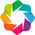

:DynamicMap   []
   :Image   [freq,time]   (z)

In [6]:
import holoviews as hv
from holoviews.operation.datashader import regrid
hv.extension('bokeh')
hv.config.image_rtol = 1
image = hv.Image(da).opts(cmap='jet', height=250, width=500, tools=['hover'])
regrided = regrid(image)
regrided

In [7]:
#save data_array as zarr file
da.to_dataset(name='power').to_zarr("new.zarr")

ContainsGroupError: path '' contains a group

In [ ]:
#open zarr file
import xarray as xr
ds = xr.open_zarr("test.zarr")

In [ ]:
image = hv.Image(ds).opts(cmap='jet', height=250, width=500, tools=['hover'])
regrided = regrid(image)
regrided

In [ ]:
ds

This is Panel class. You define parameters and each parameter will be given a widget depending on the type of parameter, to hide the widget you set the precendence to a negative number.

Holoviews DynamicMaps uses functions that return Holoviews plots when using the @param.depends decorator you can force the update of the of the DynamicMap when a parameter changes, you can also define Streams that can be fed to DynamicMaps to update the plot when an event happens.

IMPORTANT change the directory in the file to where your Zarr files are. Currently set for r'C:\Users\dondu\Documents\EMS'

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
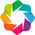

Launching server at http://localhost:52940


In [12]:
import param
import datetime
import xarray
import xarray as xr
import holoviews as hv
import panel as pn
import datashader as ds
import numpy as np
from holoviews.operation.datashader import rasterize, shade
from functools import partial
from matplotlib import cm
from holoviews.streams import Stream
import colorcet as cc
from bokeh.models import HoverTool
hv.extension('bokeh')
hv.config.image_rtol = 1.0
from matplotlib.colors import rgb2hex
import math


def fill_nan(arr):
    lst = arr.tolist()
    r_lst = list(reversed(lst))
    first = lst.index(next(filter(lambda x: not np.isnan(x), lst)))
    last = r_lst.index(next(filter(lambda x: not np.isnan(x), r_lst)))+1
    arr[first:-(last)][np.isnan(arr[first:-(last)])] = 0
    return arr

def cformatter(value):
    return str(int(value*100))+'%'

def hook(plot, element):
    plot.state.yaxis.major_tick_line_color = None        # turn off x-axis major ticks
    plot.state.yaxis.minor_tick_line_color = None        # turn off x-axis minor ticks
    plot.state.yaxis.major_label_text_font_size = '0pt'  # turn off x-axis tick labels

class SpectrumExplorer(param.Parameterized):
    #load source data
    directory = r'C:\Users\dondu\Documents\EMS'
    file = param.FileSelector(default='default', path=f'{directory}\*.zarr', label='Select File', check_on_set=False)
    load_file = param.Action(lambda x: x.param.trigger('load_file'), label='Load SOA File')
    data = param.ClassSelector(class_=xarray.Dataset, precedence=-1)
    image = param.ClassSelector(class_=hv.Image, precedence=-1)
    top_plot = param.ClassSelector(class_=hv.DynamicMap, precedence=-1)
    waterfall_plot = param.ClassSelector(class_=hv.DynamicMap, precedence=-1)
    bottom_plot = param.ClassSelector(class_=hv.DynamicMap, precedence=-1)
    density_hist = param.ClassSelector(class_=hv.Image, precedence=-1)
    hline = param.ClassSelector(class_=hv.DynamicMap, precedence=-1)
    vline = param.ClassSelector(class_=hv.DynamicMap, precedence=-1)
    tap = param.ClassSelector(class_=hv.streams.Tap, precedence=-1)
    cmap_dict = {'nipy_spectral': cm.nipy_spectral,
                 'jet': cm.jet,
                 'jet_r': cm.jet_r,
                 'gist_ncar': cm.gist_ncar}
    
    #widgets
    top_selector = param.Selector(['Sweep Bars','2D Sweep Histogram'])
    bottom_selector = param.Selector(['Duty Cycle','Power Distribution Histogram'])
    cmap = param.Selector(['bokeh','jet','jet_r', 'nipy_spectral', 'gist_ncar'])
    freq_range = param.Range(precedence=-1)
    time_range = param.DateRange(precedence=-1)
    power_range = param.Range(precedence=-1)
    clim = clim = param.Range((0,1), bounds=(-170,20))
    
    def __init__(self, **params):
        super(SpectrumExplorer, self).__init__(**params)
        
    @param.depends('data', watch=True)    
    def set_params(self):
        self.param.freq_range.bounds = (self.data.freq.data[0],self.data.freq.data[-1])
        self.param.time_range.bounds = (self.data.time.data[0],self.data.time.data[-1])
        self.param.power_range.bounds = (float(self.data.power.min()),float(self.data.power.max()))
        self.image = hv.Image(self.data)
        self.waterfall_plot = hv.DynamicMap(self.waterfall)
        self.tap = hv.streams.Tap(x=self.data.isel(freq=0).freq.values.item(), y=self.data.isel(time=0).time.values, source=self.waterfall_plot)
        self.vline = hv.DynamicMap(lambda x, y: hv.VLine(x), streams=[self.tap]).opts(line_width=1, line_color='black')
        self.hline = hv.DynamicMap(lambda x, y: hv.HLine(y), streams=[self.tap]).opts(line_width=1, line_color='black')
        self.top_plot = hv.DynamicMap(self.update_sweep_bars, streams=[self.tap])
        self.bottom_plot = hv.DynamicMap(self.update_duty, streams=[self.tap])
        self.clim = (float(self.data.power.min()),float(self.data.power.max()))
        
    @param.depends('load_file', watch=True)
    def load_df(self):
        self.data = xarray.open_zarr(self.file)
    
    @param.depends('clim', 'cmap', watch=True)
    def waterfall(self):
        #self.tap = hv.streams.Tap(x=self.data.isel(freq=0).freq.values.item(), y=self.data.isel(time=0).time.values, source=self.image)
        #image = self.image.opts(cmap=self.cmap, clim=self.clim, xlabel='Frequency (MHz)')
        return self.image.opts(cmap=self.cmap, clim=self.clim, min_height=300, min_width=600, aspect=3, responsive=True, shared_axes=True)
    
    def sweep_bars(self, y):
        #y = kwargs.get('y')
        
        data = self.image.sample(time=y).data
        y1= data['power']
        x1= data['freq']
        rbw = x1[1]-x1[0]
        freq = (x1-(rbw/2), -160, x1+(rbw/2), y1)

        return hv.Rectangles((x1-(rbw/2), -160, x1+(rbw/2), y1), vdims=['y1']).apply.opts(line_width=0,
                                                         color='y1',
                                                         min_width=600,
                                                         min_height = 150,
                                                         aspect=5,
                                                         cmap=self.cmap,
                                                         clim=self.clim,
                                                         padding=0,
                                                         bgcolor='black',
                                                         line_color='transparent',
                                                         line_join = 'bevel',
                                                         tools=['hover'],
                                                         #xlabel='Frequency (MHz)',
                                                         #ylabel='Power (dBm)',
                                                         hooks=[],
                                                         responsive=True
                                                        ).redim(x0='freq', y0='power')
    

    
    #takes the Tap stream and returns the Rectangles plot (created by method 'sweep_bars') to a DynamicMap
    @param.depends('clim','cmap')
    def update_sweep_bars(self, **kwargs):
        y = kwargs.get('y')
        if self.cmap == 'nipy_spectral':
            bgcolor = 'darkgrey'
        else:
            bgcolor = 'black'
        return self.sweep_bars(y=y).apply.opts(clim=self.clim, cmap=self.cmap, bgcolor=bgcolor, shared_axes=True)
    
    @param.depends('cmap')
    def update_density_hist(self):
        return self.density_hist.apply.opts(cmap=self.cmap, shared_axes=True, dynamic=False)
    
    
    def hist_line(self, **kwargs):
        x = kwargs.get('x')
        ylim = kwargs.get('ylim')
        data = np.array(self.image.sample(freq=x).data['power'])
        if data.all() == None:
            pass
        filtered_data = data[data > ylim[0]]
        mini = min(data)
        mini = round(mini * 2) / 2
        maxi = max(data)
        maxi = round(maxi * 2) / 2
        bins = int(maxi-mini)*2
        if ylim[0] > mini:
            mini = round(ylim[0] * 2)/2
            bins = int(maxi-mini)*2
        if mini >= maxi:
            hist_data = None
        else:
            hist_data = np.histogram(filtered_data, bins, range=(mini,maxi))
        #print(hist_data, bins)
        hist = hv.Histogram(hist_data)
        return hv.Area(hist).opts(min_width=600,
                                  min_height = 150,
                                  aspect=5,
                                  responsive=True,
                                  xlabel = "Power",
                                  ylabel = "Count",
                                  hooks=[],
                                  framewise=True,
                                  padding=0.2
                                  )
    #partial(bounds_hook, ybounds=(0, max(hist_data[0]))),partial(range_hook, y_range=(0,max(hist_data[0])))
    
    @param.depends('clim','cmap')
    def update_hist_line(self,**kwargs):
        x = kwargs.get('x')
        return self.hist_line(x=x, ylim=self.clim).redim(freq='count', x='power_bins')
    
    def duty(self,x):
        return hv.Curve(self.image.sample(freq=x)).opts(min_width=600, line_color='blue', bgcolor='red', xlabel="", aspect=5, responsive=True)
    
    @param.depends('cmap')
    def update_duty(self, **kwargs):
        x = kwargs.get('x')
        if self.cmap == 'bokeh':
            line_color = 'orange'
            bgcolor = 'purple'
        else:
            cmap = self.cmap_dict.get(self.cmap)
            line_color = rgb2hex(cmap(127))
            bgcolor = rgb2hex(cmap(0))
        return self.duty(x=x).apply.opts(shared_axes=True, line_color=line_color, bgcolor=bgcolor)
    
    def make_density_hist(self):
        #cmap = 'jet_r'
        bgcolor='black'

        maxi = self.data.power.max(dim='time')
        mini = self.data.power.min(dim='time')
        mean = self.data.power.mean(dim='time')

        hover = HoverTool(tooltips=[("Frequency", "$index")])

        #x = np.tile(data.freq.values, 347).flatten()
        x=np.tile(self.data.freq.values,len(self.data.time)).flatten()
        y = self.data.power.values.flatten()
        xmin = x.min()
        xmax = x.max()+6250
        ymin = math.floor(y.min())
        ymax = math.floor(y.max())

        xbin = len(self.data.freq.values)
        ybin = int((ymax-ymin))

        hist, xe, ye = np.histogram2d(x, y, bins=(xbin,ybin), range=[[xmin, xmax], [ymin, ymax]], density=None, weights=None)
        hist[hist == 0] = np.NaN

        xar = xr.DataArray(hist, coords=[xe[:-1], ye[:-1]], dims=["freq", "power"], name="density")

        num = len(xar.values)

        xar = xar/len(self.data.power)

        clist = np.nanpercentile(xar, [2,98])

        i = 0
        for a in xar.values:
            xar[i] = fill_nan(a)
            i = i + 1

        self.density_hist = hv.Image(xar).opts(width=1200, 
                                              cmap=self.cmap, 
                                              bgcolor=bgcolor, 
                                              clim=(clist[0],clist[1]), 
                                              #colorbar=True,
                                              tools=['hover'], 
                                              clipping_colors={'NaN': 'transparent', 'min': '#2E3033'}, 
                                              xlabel='Frequency (MHz)',
                                              ylabel = 'Power (dBm)',
                                              #cformatter=cformatter, 
                                              #clabel='Density',
                                              show_grid=False)
    
    @param.depends('bottom_selector','top_selector',watch=True)
    def update_plots(self):
        if self.bottom_selector == 'Power Distribution Histogram':
            self.bottom_plot = hv.DynamicMap(self.update_hist_line, streams=[self.tap])
        elif self.bottom_selector == 'Duty Cycle':
            self.bottom_plot = hv.DynamicMap(self.update_duty, streams=[self.tap]).apply.opts(padding=0.1)
        if self.top_selector == 'Sweep Bars':
            self.top_plot = hv.DynamicMap(self.update_sweep_bars, streams=[self.tap])
        elif self.top_selector == '2D Sweep Histogram':
            if self.density_hist == None:
                self.make_density_hist()
            self.top_plot = hv.DynamicMap(self.update_density_hist)
    
    @param.depends('power_range','bottom_plot','top_plot')
    def view(self):
        if self.data is not None:
            col = pn.Column(pn.Pane(self.top_plot, sizing_mode='stretch_both'),(self.waterfall_plot*self.hline*self.vline),pn.Pane(self.bottom_plot, sizing_mode='stretch_both'), width_policy='max')
            return col

explorer = SpectrumExplorer()
    
from panel.template import DarkTheme

dark_template = pn.template.MaterialTemplate(title='Spectrum Explorer', theme='dark')
dark_template.sidebar.append(explorer.param)
dark_template.main.append(explorer.view)

dark_template.show()

AttributeError: module 'panel' has no attribute 'help'